In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

plt.rcParams["axes.grid"] = False




/home/a39083/.virtualenvs/dino_plain/lib/python3.10/site-packages/xarray/backends/cfgrib_.py:27: UserWarning: Failed to load cfgrib - most likely there is a problem accessing the ecCodes library. Try `import cfgrib` to get the full error message
  warnings.warn(


In [2]:
features = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/Model25_Balanced_320000_8w.csv', header=None, sep=r',|\t', engine='python') # Model 25, 320000 patches

In [3]:
# Changing Labels
mapping = {'SchoolZarr_1': 'other', 'SchoolZarr_27': 'sandeel', 'BackgroundZarr': 'background'}
features.iloc[:,1] = features.iloc[:,1].replace(mapping)
features

,0,1,2,3,4,5,6,7,8,9,...,130,131,132,133,134,135,136,137,138,139
0,0,other,2011,225,592530,SchoolZarr_1,31,31,31,-70.773590,...,0.033280,0.081923,0.228392,0.085226,0.041568,0.008509,0.003279,0.000000,0.000000,del
1,1,sandeel,2007,322,972319,SchoolZarr_27,31,31,31,-49.653403,...,0.000000,0.000000,0.122960,0.007665,0.398777,0.001360,0.000000,0.000000,0.000000,del
2,2,background,2011,20,964979,BackgroundZarr,31,31,31,-73.406389,...,0.043627,0.134686,0.006074,0.035722,0.000000,0.047411,0.092189,0.005426,0.000000,del
3,3,other,2014,352,2008168,SchoolZarr_1,31,31,31,-68.545154,...,0.000000,0.204668,0.012528,0.006696,0.074657,0.001111,0.023466,0.003739,0.039116,del
4,4,other,2008,359,3395952,SchoolZarr_1,31,31,31,-67.490530,...,0.072983,0.000140,0.047803,0.012554,0.069673,0.006649,0.008331,0.002436,0.179827,del
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319995,319995,background,2015,15,180149,BackgroundZarr,31,31,31,-64.693636,...,0.004267,0.000000,0.000000,0.103606,0.019729,0.017544,0.010032,0.000000,0.000000,del
319996,319996,other,2008,228,1753568,SchoolZarr_1,31,31,31,-47.296796,...,0.021538,0.073411,0.192181,0.067942,0.113337,0.000947,0.004962,0.000000,0.000000,del
319997,319997,sandeel,2009,244,852850,SchoolZarr_27,31,31,31,-69.201187,...,0.000000,0.219898,0.311654,0.031591,0.212516,0.000000,0.000000,0.005374,0.147990,del
319998,319998,sandeel,2015,200,485754,SchoolZarr_27,31,31,31,-73.903852,...,0.024556,0.011022,0.222057,0.114079,0.009710,0.010084,0.000000,0.000000,0.114284,del


# Once DIREKT DENEME 320000 SAMPLE UZERINDE

Accuracy: 79.98%
Confusion Matrix:
[[20041   751   447]
 [ 2497 15112  3827]
 [ 1980  3311 16034]]


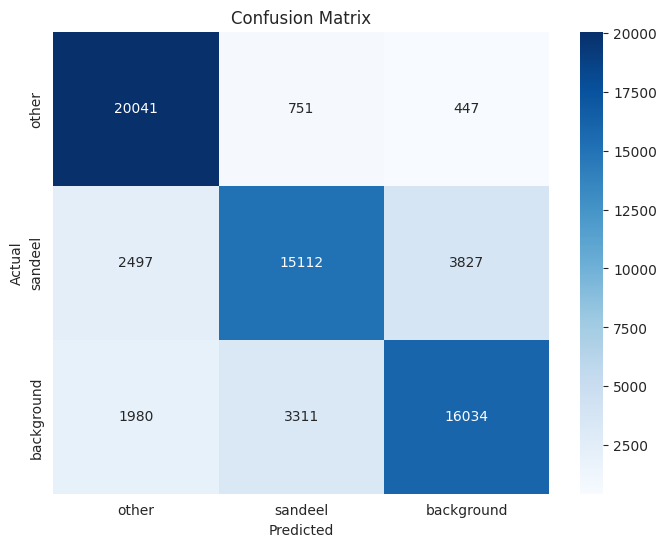

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.decomposition import PCA

# Separate features and labels
X = features.iloc[:, 11:139]  # Features for 512 features it is 11:+128+256
y = features.iloc[:, 1] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)

knn = KNeighborsClassifier(n_neighbors=15, metric='euclidean') 
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)


y_pred = knn.predict(X_test)

misclassified_samples = X_test[y_test != y_pred]
misclassified_real_classes = y_test[y_test != y_pred]
misclassified_predicted_classes = y_pred[y_test != y_pred]

misclassified_indices = X_test.index[y_test != y_pred]

original_rows = features.iloc[misclassified_indices, :].copy()
original_rows.insert(0, 'Predicted Class', misclassified_predicted_classes)


correctly_classified_indices = X_test.index[y_test == y_pred]
correctly_classified_original_rows = features.iloc[correctly_classified_indices, :].copy()
correctly_classified_original_rows.insert(0, 'Predicted Class', y_pred[y_test == y_pred])

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=features[1].unique(), yticklabels=features[1].unique())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# PCA and Plot
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

X_test_pca = pca.transform(X_test)

fig = go.Figure()
for label in features.iloc[:, 1].unique():
    indices = (y_test == label)
    fig.add_trace(go.Scatter3d(
        x=X_test_pca[indices, 0],
        y=X_test_pca[indices, 1],
        z=X_test_pca[indices, 2],
        mode='markers',
        name=label,
        marker=dict(size=2, symbol='circle')
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    ),
    title='Interactive 3D Scatter Plot of Test Set Predictions',
    legend=dict(x=0, y=1.0),
    width=800, 
    height=600, 
)
fig.show()

# Testing on 2017 Data

In [17]:
# Reading 2017 features
features_test = pd.read_csv('/scratch/disk5/ahmet/dino_output/extracted_features/100ep_acoustics_8w_Random_Bg_9_TrainSurveys_NEAREST_ResNet18Modified_128NONNormalized_8192Out_FixAug_2048Batch_FixedData_ADAMW(NOBlur)_2017_GriddedAll_NoCenterCrop_IgnoredFish_FixedTestData.csv', header=None, sep=r',|\t', engine='python')

In [18]:

np.random.seed(1)
features_test.iloc[:, 1].replace({'other_seabed': 'other', 'sandeel_seabed': 'sandeel', 'seabed': 'background'}, inplace=True)
features_test = features_test.groupby(1, group_keys=False).apply(lambda x: x.sample(min(13000, len(x)), replace=False))
features_test.reset_index(drop=True,inplace=True)
print(features_test.iloc[:, 1].value_counts())


np.random.seed(1)
#features = features.groupby(1, group_keys=False).apply(lambda x: x.sample(min(1883, len(x)), replace=False))
filtered_df = features_test[~features_test.iloc[:, 1].isin(['other_seabed', 'sandeel_seabed', 'sandeel_other', 'sandeel_other_seabed'])]
filtered_df = features_test[~features_test.iloc[:, 1].isin([ 'sandeel_other'])]
features_test=filtered_df.reset_index(drop=True)
features_test.iloc[:, 1].value_counts()

sandeel          13000
other            13000
background       13000
sandeel_other       57
Name: 1, dtype: int64


sandeel       13000
other         13000
background    13000
Name: 1, dtype: int64

In [19]:
# Creating the same test set
from sklearn.model_selection import train_test_split
X = features_test.iloc[:, 11:139]
y = features_test.iloc[:, 1]   

X_train_2017, X_test, y_train_2017, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)

In [ ]:
# Applying kNN on 320000, testing on 2017 test patches

Accuracy: 59.17%
Confusion Matrix:
[[1256  794  550]
 [ 613 1515  472]
 [ 515  241 1844]]


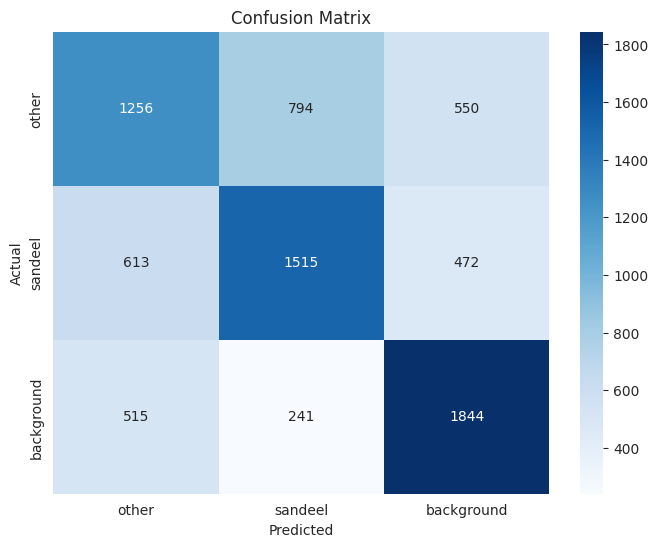

In [20]:

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.decomposition import PCA

X_train, y_train = features.iloc[:, 11:139], features.iloc[:, 1] 
X_test, y_test = X_test, y_test

knn = KNeighborsClassifier(n_neighbors=15, metric='euclidean')  # You can adjust the number of neighbors
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)


y_pred = knn.predict(X_test)

misclassified_samples = X_test[y_test != y_pred]
misclassified_real_classes = y_test[y_test != y_pred]
misclassified_predicted_classes = y_pred[y_test != y_pred]

misclassified_indices = X_test.index[y_test != y_pred]

original_rows = features.iloc[misclassified_indices, :].copy()
original_rows.insert(0, 'Predicted Class', misclassified_predicted_classes)


correctly_classified_indices = X_test.index[y_test == y_pred]
correctly_classified_original_rows = features.iloc[correctly_classified_indices, :].copy()
correctly_classified_original_rows.insert(0, 'Predicted Class', y_pred[y_test == y_pred])


accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plot the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=features[1].unique(), yticklabels=features[1].unique())
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# PCA and Plot
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

X_test_pca = pca.transform(X_test)

fig = go.Figure()
for label in features.iloc[:, 1].unique():
    indices = (y_test == label)
    fig.add_trace(go.Scatter3d(
        x=X_test_pca[indices, 0],
        y=X_test_pca[indices, 1],
        z=X_test_pca[indices, 2],
        mode='markers',
        name=label,
        marker=dict(size=2, symbol='circle')
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3'
    ),
    title='Interactive 3D Scatter Plot of Test Set Predictions',
    legend=dict(x=0, y=1.0),
    width=800, 
    height=600,
)
fig.show()

In [22]:
y_train

0              other
1            sandeel
2         background
3              other
4              other
             ...    
319995    background
319996         other
319997       sandeel
319998       sandeel
319999         other
Name: 1, Length: 320000, dtype: object